In [3]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib import pyplot as plt

In [4]:
# Auflösung
N = 2 ** 7

In [5]:
xrange = np.linspace(-2, +2, N)
yrange = np.linspace(-2, +2, N)
zrange = np.linspace(-2, +2, N)
x, y, z = np.meshgrid(xrange, yrange, zrange, indexing='ij')

In [6]:
# Ortsvektorfeld
r_vec = np.array([x,y,z])
r_vec.shape

(3, 128, 128, 128)

In [7]:
# Abstand vom Ursprung
r = np.linalg.norm(r_vec, axis=0)
r.shape

(128, 128, 128)

$$
    \vec E_d (\vec r) = \dfrac {1}{4\pi\epsilon_0} \Bigg [\dfrac {3\vec p \vec r}{r^5}-\dfrac{\vec p}{r^3}\Bigg ]
$$

Konstanten und Parameter würde ich am Anfang definieren.  Sonst muss man durch den ganzen Code scrollen, wenn man wissen möchte, wie ein bestimmter Wert definiert ist.  Außerdem lässt sich dann ein Parameter einfacher ändern. (@Konrad Schöbel)

In [15]:
p = 0.0000001  # Das Dipolmoment ist doch aber ein Vektor? (@ks)
e_0 = 8.854*np.power(10.0, -12.0)  # Wollt Ihr wirklich keine SI-Einheiten verwenden?  Wieso? (@ks)
c = 1/(4*np.pi*e_0)
rx,ry,rz = r_vec
Ex = c*(3*p*rx/r**5 - p/r**3)
Ey = c*(3*p*ry/r**5 - p/r**3)
Ez = c*(3*p*rz/r**5 - p/r**3)

E_vec = np.array([Ex,Ey,Ez])
E_vec.shape

(3, 128, 128, 128)

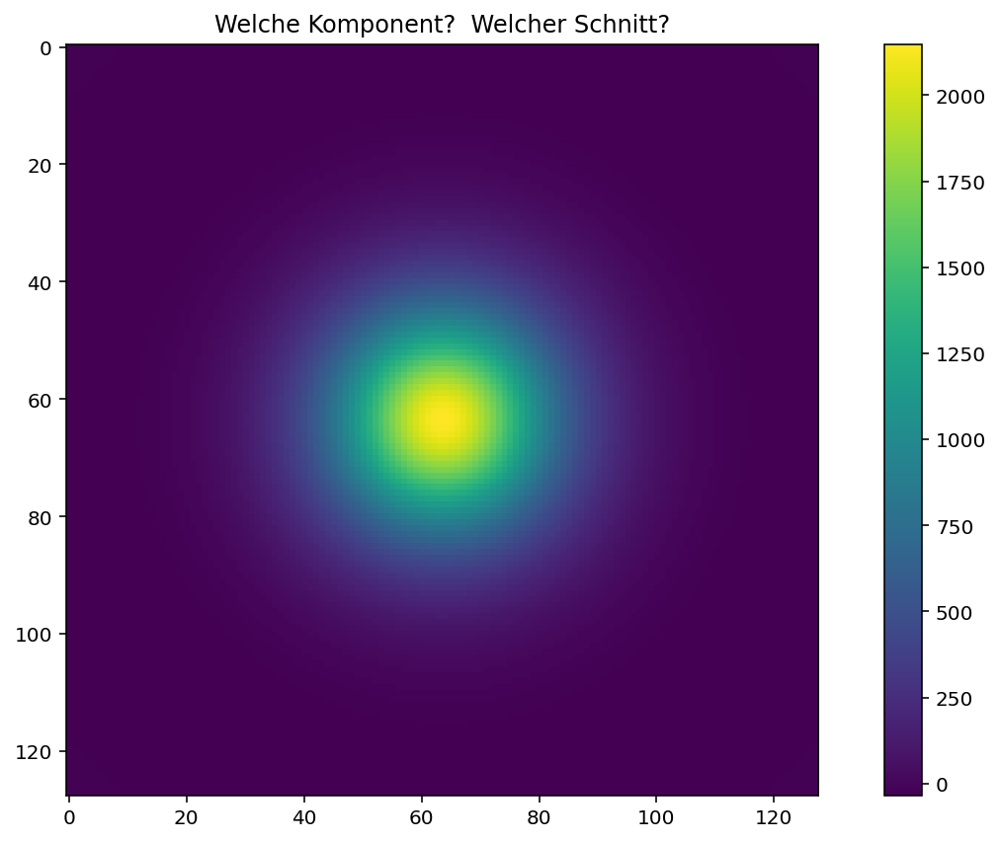

In [16]:
plt.title('Welche Komponent?  Welcher Schnitt?')  # @ks
plt.imshow(E_vec[0,(N//2)+30,:,:])
plt.colorbar()

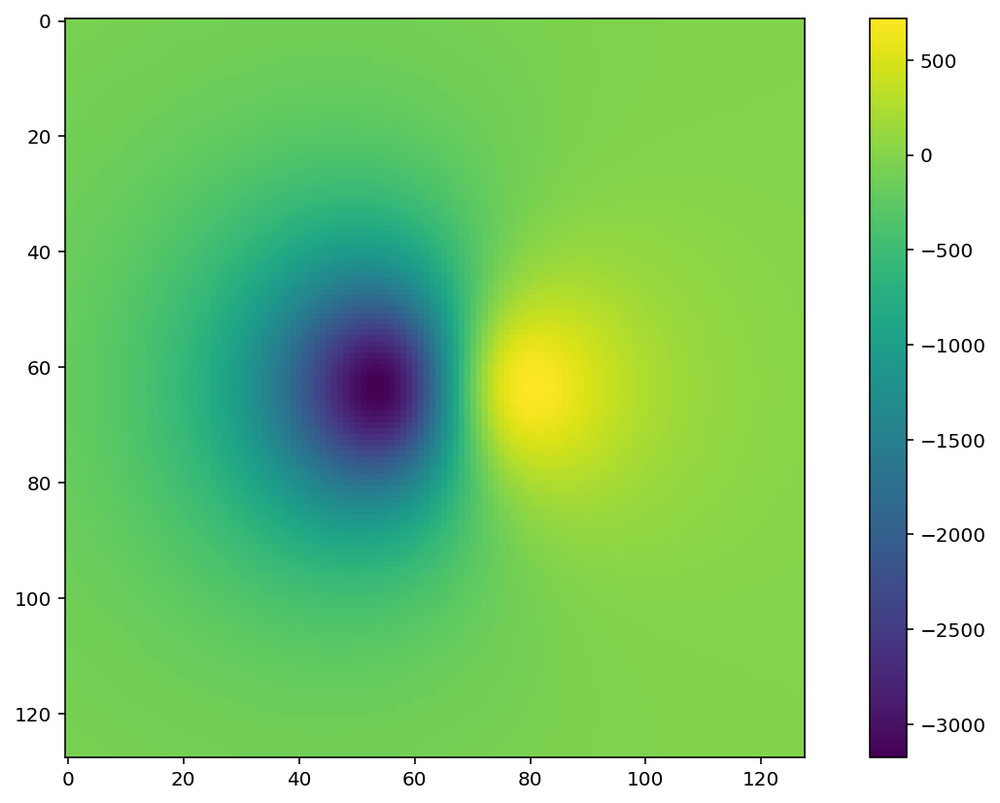

In [17]:
plt.imshow(E_vec[2,(N//2)+25,:,:])
plt.colorbar()

**Weiter so.** (@Konrad Schöbel)

In [18]:
X,Y,Z = E_vec

In [19]:
X.shape

(128, 128, 128)

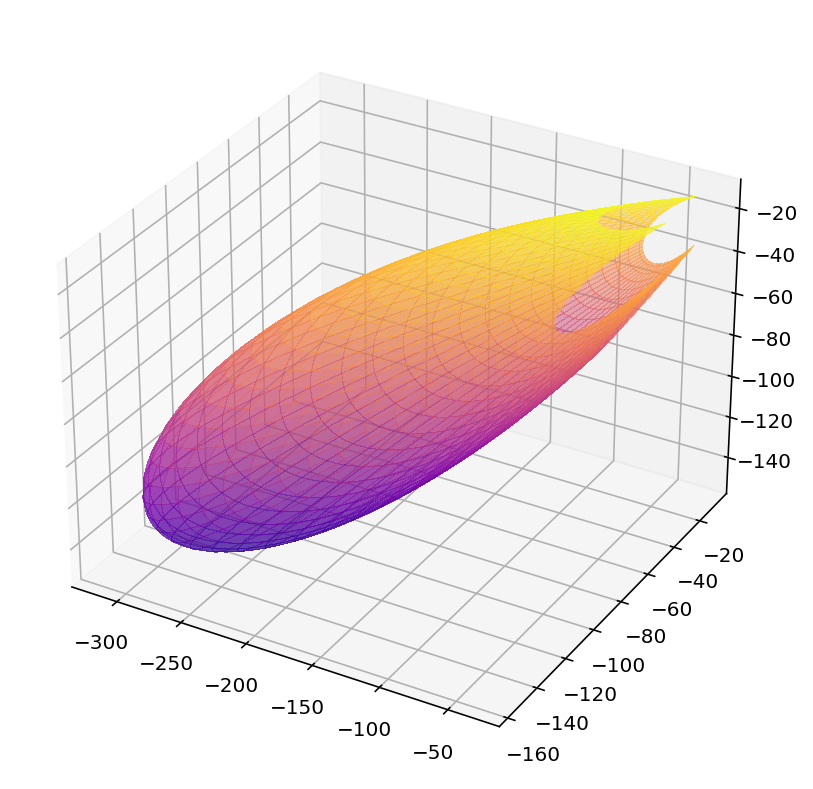

In [20]:


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X[2], Y[2], Z[2], cmap="plasma", linewidth=0, antialiased=False, alpha=0.5)
plt.show()

# Test Spielwiese

In [3]:
import numpy as np
from matplotlib import pyplot as pp

In [4]:
N = 2**10

In [5]:
theta = np.linspace(-np.pi/2, +np.pi/2,   N)[:,None]
phi   = np.linspace(-np.pi  , +np.pi  , 2*N)[None,:]
theta.shape, phi.shape

((1024, 1), (1, 2048))

In [49]:
mu = 1
current_constant = 1
length = 1

constant = (mu*current_constant*length)/(4*np.pi)

In [50]:
x = -np.sin(phi) * np.sin(theta) * constant
y = np.cos(phi) * np.sin(theta) * constant
z = np.ones_like(phi)*np.zeros_like(theta)

vec_r = np.array([x,y,z])
hx,hy,hz = vec_r

r = np.linalg.norm(vec_r, axis=0)
hx = hx / r
hy = hy/r
hz = hz/r
vec_h = np.array([hx,hy,hz])

vec_r.shape

(3, 1024, 2048)

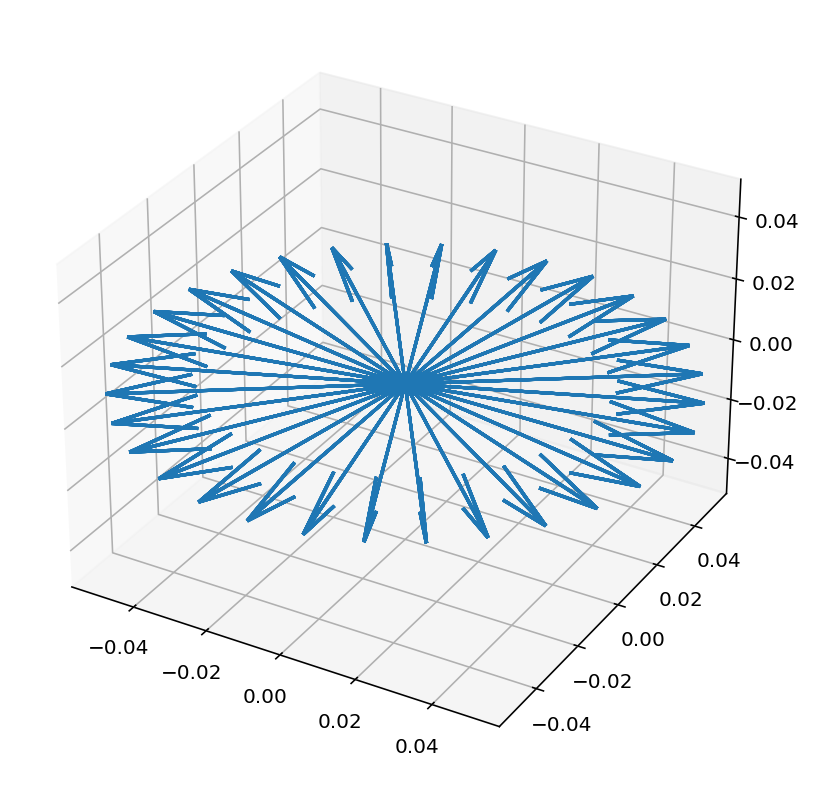

In [51]:
fig = pp.figure()
ax = fig.add_subplot(projection='3d')

s = 2**6  # stride
x,y,z = vec_h[:,::s,::s]
#ax.scatter(x, y, z, '.');
ax.quiver(0,0, 0,x, y, z,length = 0.07, normalize = True)
#ax.plot_surface(x,y,z, cmap="plasma", linewidth=0, antialiased=False, alpha=0.5)

<!-- Buch finite Dipole S. 166 -->

Fernfeld:

$$

	E_{\theta} \approx j \eta \frac{I_0 e^{-jkr}}{2 \pi r} \left[\frac{ \cos{(\frac{kl}{2} \cos \theta)} - \cos{(\frac{kl}{2}}}{\sin\theta} \right]

$$

$$
	
    H_{\phi} \approx j \frac{I_0 e^{-jkr}}{2 \pi r} \left[\frac{ \cos{(\frac{kl}{2} \cos \theta)} - \cos{(\frac{kl}{2}}}{\sin\theta} \right]

$$

In [3]:
from matplotlib import pyplot as plt
import numpy as np

In [4]:
def unitvector_r(r, theta, phi):
  x = r * np.cos(phi)*np.sin(theta)
  y = r * np.sin(phi)*np.sin(theta)
  z = r * np.cos(theta)
  return x, y, z

In [10]:
def unitvector_theta(r, theta, phi):
    x = r * np.cos(theta) * np.cos(phi)
    y = r * np.cos(theta) * np.sin(phi) 
    z = r * -1*np.sin(theta)
    return x, y, z

In [6]:
def unitvector_phi(r, theta, phi):
    x = r * -1 * np.sin(theta)*np.sin(phi)
    y = r *      np.sin(theta)*np.cos(phi)
    z = np.zeros_like(x)
    return x, y, z

In [7]:
def electric_field(I_0, l, observation_distance, theta):
    """
    Berechnet das elektrische Feld mit den gegebenen Komponenten.

    I_0: Amplitude des Stroms
    l: Länge des Dipols
    observation_distance: Beobachtungsentfernung vom Dipol (Array oder einzelner Wert)
    theta: Theta-Winkel (Array oder einzelner Wert)
    """
    # Konstanten
    eta = 376.730313  # Wellenimpedanz des freien Raums

    # Umrechnung in Radiant
    theta_rad = np.radians(theta)

    # Berechnung des elektrischen Feldes
    r = observation_distance
    k = 2 * np.pi
    kr = k * r
    factor = (I_0 * np.exp(-1j * kr))/((2 * np.pi * r))
    phasefactor = (np.cos(((k*l)/2)*np.cos(theta)) - np.cos(k*l/2))/np.sin(theta)
    E_theta = 1j * eta * factor *phasefactor
    return E_theta

In [8]:
def magnetic_field(I_0, l, observation_distance, theta):
    """
    Berechnet das elektrische Feld mit den gegebenen Komponenten.

    I_0: Amplitude des Stroms
    l: Länge des Dipols
    observation_distance: Beobachtungsentfernung vom Dipol (Array oder einzelner Wert)
    theta: Theta-Winkel (Array oder einzelner Wert)
    """
    # Konstanten
    eta = 376.730313  # Wellenimpedanz des freien Raums

    # Umrechnung in Radiant
    theta_rad = np.radians(theta)

    # Berechnung des elektrischen Feldes
    r = observation_distance
    k = 2 * np.pi
    kr = k * r
    factor = (I_0 * np.exp(-1j * kr))/((2 * np.pi * r))
    phasefactor = (np.cos(((k*l)/2)*np.cos(theta)) - np.cos(k*l/2))/np.sin(theta)
    phasefactor = (phasefactor*r)/r
    H_phi = 1j * factor *phasefactor
    return H_phi

Text(0.5, 0, 'Z axis')

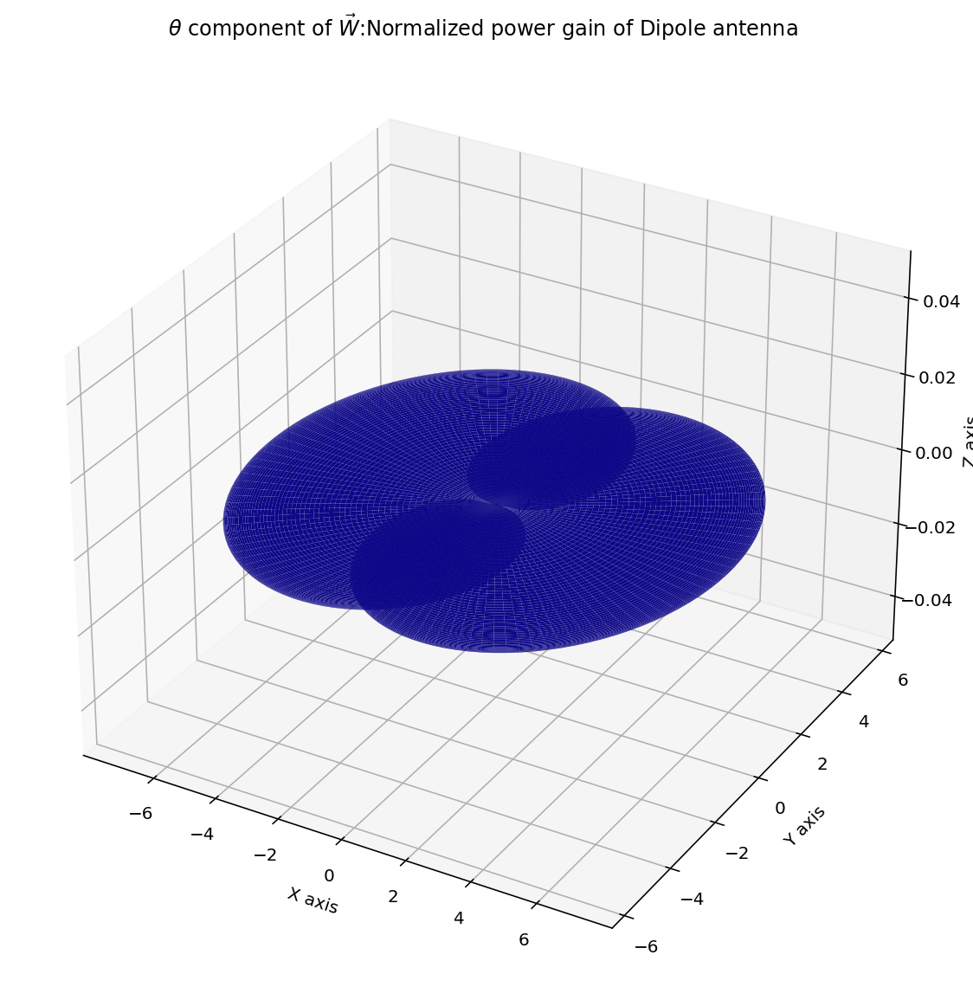

In [40]:
numPts = 2**7

l = 0.0001
I_0 = 1.0  # Amplitude des Stroms

observation_distance = 2

theta = np.linspace(start=0.1, stop=np.pi, num=numPts)
phi = np.linspace(start=0.1, stop=2 * np.pi, num=numPts)
[P, T] = np.meshgrid(phi, theta)
E_theta = electric_field(I_0, l, observation_distance, theta)
[x,y,z] = unitvector_theta(E_theta, T,P)

fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(12, 10))
ax.plot_surface(np.real(x), np.real(y), np.zeros_like(x), rstride=1, cstride=1, cmap='plasma')
ax.set_title(r'$\theta$ component of $\vec W$:Normalized power gain of Dipole antenna')
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

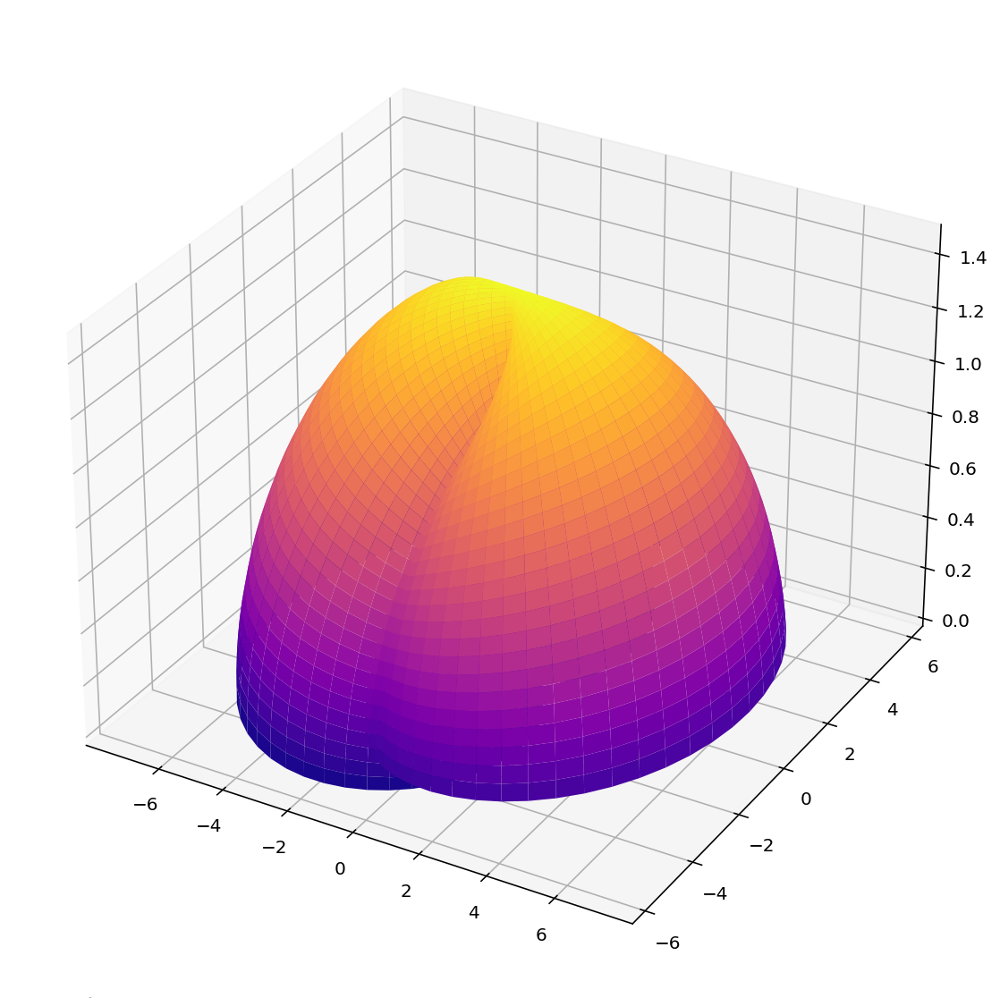

In [39]:
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(12, 10))
ax.plot_surface(np.real(x), np.real(y), np.abs(z), rstride=1, cstride=1, cmap='plasma')

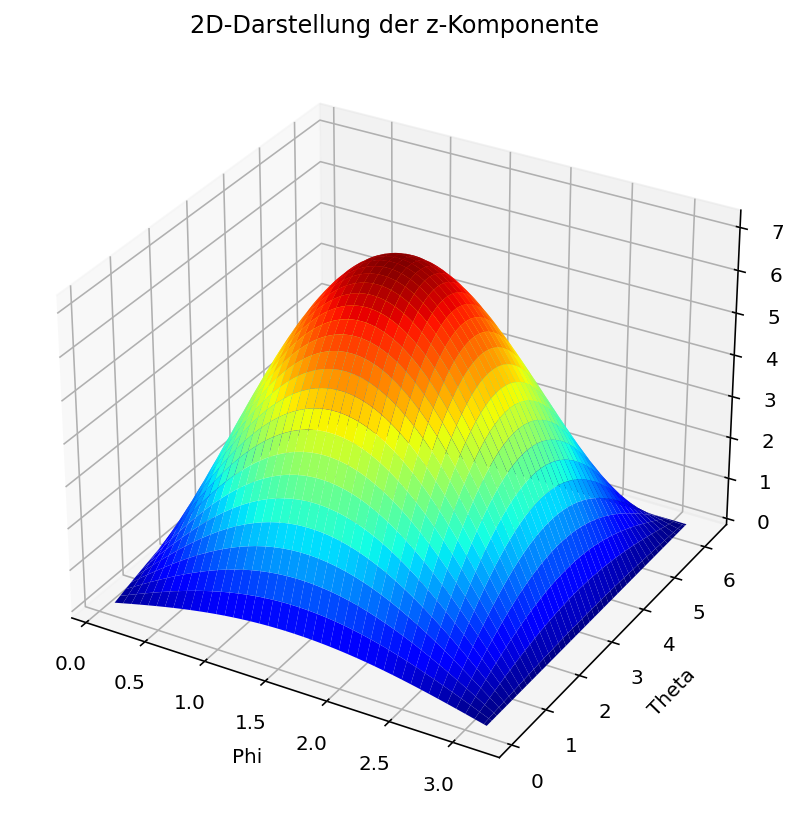

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Definition der Funktionen und Variablen

# Erstelle ein 3D-Feldgitter
X, Y = np.meshgrid(np.abs(theta), np.abs(phi))

# Konvertiere die z-Komponente in eine 2D-Darstellung
#Z = np.reshape(np.abs(y), (numPts, numPts))

# Erstelle den 3D-Plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, z, cmap='jet')

# Achsenbeschriftungen
ax.set_xlabel('Phi')
ax.set_ylabel('Theta')
ax.set_zlabel('z-Komponente')

# Titel
ax.set_title('2D-Darstellung der z-Komponente')

# Anzeigen des Plots
plt.show()

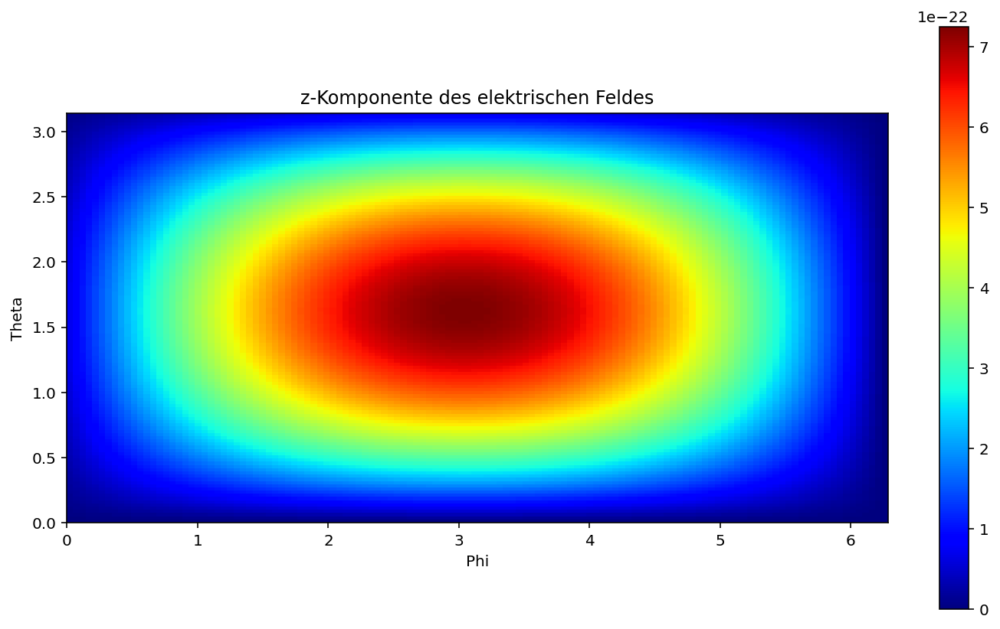

In [42]:
z_2d = np.reshape(np.real(z), (numPts, numPts))

plt.imshow(z_2d, cmap='jet', extent=[0, 2*np.pi, 0, np.pi])
plt.colorbar()
plt.xlabel('Phi')
plt.ylabel('Theta')
plt.title('z-Komponente des elektrischen Feldes')
plt.show()

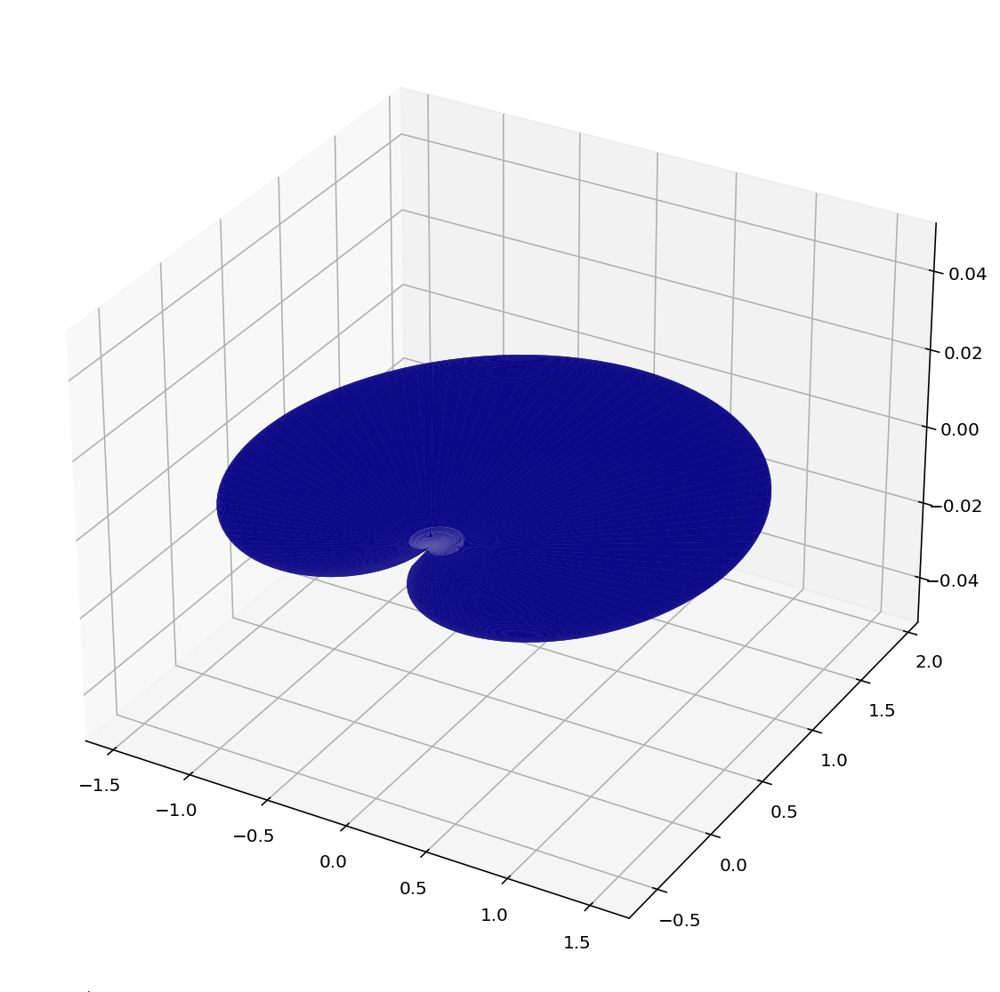

In [36]:

H_phi = magnetic_field(I_0, l, observation_distance, theta)
[h_x, h_y, h_z] = unitvector_phi(H_phi,T,P)

fig, ax = plt.subplots(subplot_kw=dict(projection='3d'), figsize=(12, 10))
ax.plot_surface(np.real(h_x), np.real(h_y), np.abs(h_z), rstride=1, cstride=1, cmap='plasma')

# nur ein test

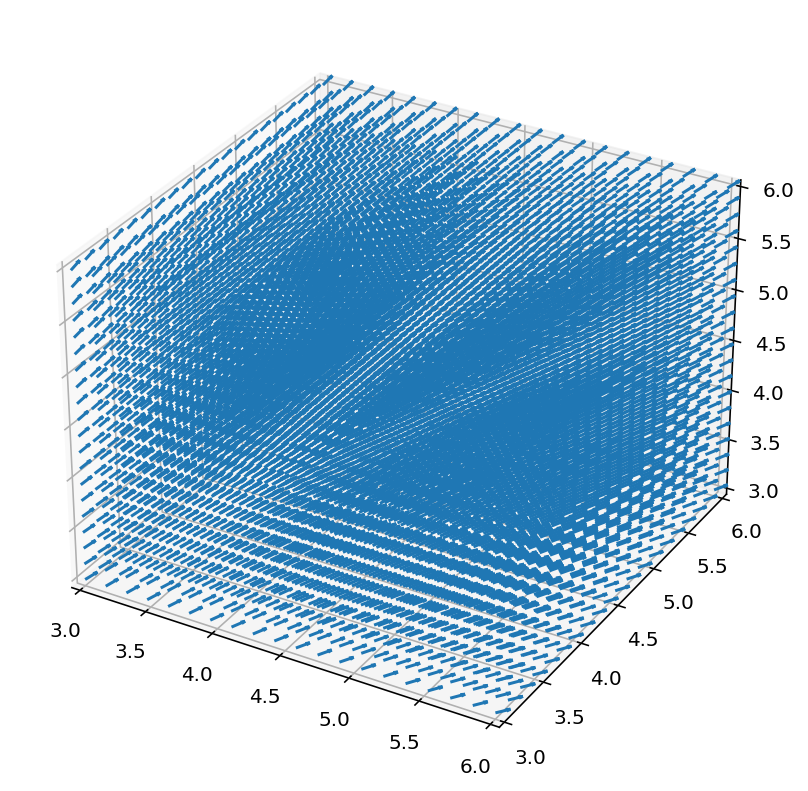

In [21]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt

# Create some symbolic variables
x, y, z = sp.symbols('x y z')
rad, th, phi = sp.symbols('rad th phi')

# Transform polar coords to Cartesian
def sphere_xyz(R, theta, phi):
    r = R * sp.sin(theta)
    return r * sp.cos(phi), r * sp.sin(phi), R * sp.cos(theta)

# Transform Cartesian coords to polar
def xyz_sphere(X, Y, Z):
    r2 = X**2 + Y**2
    r = sp.sqrt(r2)
    R = sp.sqrt(r2 + Z**2)
    return R, sp.atan2(r, Z), sp.atan2(Y, X)

# The equation in polar coords
H_polar = (2 * sp.cos(th) / rad**3, sp.sin(th) / rad**3, 0)

I_0 = 1
kr=1
k = 1
l = 1
factor = (I_0 * sp.exp(-1j * kr))/((2 * sp.pi * r))
phasefactor = (sp.cos(((k*l)/2)*sp.cos(th)) - sp.cos(k*l/2))/sp.sin(th)
phasefactor = (phasefactor*r)/r
H_polar = 1j * factor *phasefactor

# Transform equation to Cartesian
R, theta, phi = xyz_sphere(x, y, z)
H_xyz = sphere_xyz(R, theta, phi)

# Create lambdified functions
H_x = sp.lambdify((x, y, z), H_xyz[0])
H_y = sp.lambdify((x, y, z), H_xyz[1])
H_z = sp.lambdify((x, y, z), H_xyz[2])

# Define the range of values
lo, hi = 3, 6
points = 20

# Create a grid of points
X, Y, Z = np.meshgrid(np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points))

# Evaluate the functions on the grid
U = H_x(X, Y, Z)
V = H_y(X, Y, Z)
W = H_z(X, Y, Z)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.quiver(X, Y, Z, U, V, W, length=0.1, normalize=True)

# Set the plot limits
ax.set_xlim([lo, hi])
ax.set_ylim([lo, hi])
ax.set_zlim([lo, hi])

# Show the plot
plt.show()



## Sphärische Koordinaten in Cone des $H_\phi$

In [50]:
import sympy as sp
import numpy as np
import plotly.graph_objects as go

# Create some symbolic variables
x, y, z = sp.symbols('x y z')
# Kugelkoordinaten-Symbole
r, theta, phi = sp.symbols('r theta phi')

# Transform polar coords to Cartesian
def sphere_xyz(R, theta, phi):
    r = R * sp.sin(theta)
    return r * sp.cos(phi), r * sp.sin(phi), R * sp.cos(theta)

# Transform Cartesian coords to polar
def xyz_sphere(X, Y, Z):
    r2 = X**2 + Y**2
    r = sp.sqrt(r2)
    R = sp.sqrt(r2 + Z**2)
    return R, sp.atan2(r, Z), sp.atan2(Y, X)

# The equation in polar coords
#H_polar = (2 * sp.cos(th) / rad**3, sp.sin(th) / rad**3, 0)
I_0 = 1
kr=1
k = 1
l = 1
factor = (I_0 * sp.exp(-1j * kr))/((2 * sp.pi * r))
phasefactor = (sp.cos(((k*l)/2)*sp.cos(theta)) - sp.cos(k*l/2))/sp.sin(theta)
phasefactor = (phasefactor*r)/r
H_polar = 1j * factor *phasefactor

# Transform equation to Cartesian
R, theta, phi = xyz_sphere(x, y, z)
H_xyz = transform_to_xyz(H_polar, r, theta, phi)
H_x, H_y, H_z = H_xyz


In [54]:
# Create lambdified functions
H_x = sp.lambdify((x, y, z), H_x, 'numpy')
H_y = sp.lambdify((x, y, z), H_y, 'numpy')
H_z = sp.lambdify((x, y, z), H_z, 'numpy')

# Define the range of values
lo, hi = -2, 2
points = 10

# Create a grid of points
X, Y, Z = np.meshgrid(np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points))

# Evaluate the functions on the grid
U = H_x(X, Y, Z)
V = H_y(X, Y, Z)
W = H_z(X, Y, Z)

# Create a 3D plot
fig = go.Figure(data=go.Cone(x=X.flatten(), y=Y.flatten(), z=Z.flatten(),
                            u=U.flatten(), v=V.flatten(), w=W.flatten(),
                            sizemode='scaled', sizeref=0.5,
                            colorscale='Inferno', showscale=True))

# Set the plot layout
fig.update_layout(scene=dict(xaxis=dict(range=[lo, hi]),
                             yaxis=dict(range=[lo, hi]),
                             zaxis=dict(range=[lo, hi])))

# Show the plot
fig.show()


SympifyError: Sympify of expression 'could not parse '<function _lambdifygenerated at 0x7f5954a5fd00>'' failed, because of exception being raised:
SyntaxError: invalid syntax (<string>, line 1)

In [40]:
def transform_to_xyz(expr, r, theta, phi):
    # Symbole für kartesische Koordinaten
    x, y, z = sp.symbols('x y z')

    # Transformation der Kugelkoordinaten in kartesische Koordinaten
    x_expr = expr.subs({r: sp.sqrt(x**2 + y**2 + z**2), theta: sp.acos(z / sp.sqrt(x**2 + y**2 + z**2)), phi: sp.atan2(y, x)})
    y_expr = x_expr.subs(x, y)
    z_expr = y_expr.subs(y, z)

    return x_expr, y_expr, z_expr

In [42]:
# Beispielgleichung in Kugelkoordinaten
expr = r**2 * sp.sin(theta) * sp.cos(phi)

I_0 = 1
kr=1
k = 1
l = 1
factor = (I_0 * sp.exp(-1j * kr))/((2 * sp.pi * r))
phasefactor = (sp.cos(((k*l)/2)*sp.cos(theta)) - sp.cos(k*l/2))/sp.sin(theta)
phasefactor = (phasefactor*r)/r
expr = 1j * factor *phasefactor

# Kugelkoordinaten-Symbole
r, theta, phi = sp.symbols('r theta phi')

# Umwandlung in kartesische Koordinaten
x_expr, y_expr, z_expr = transform_to_xyz(expr, r, theta, phi)

# Ausgabe der umgewandelten Gleichungen
print(x_expr)
print(y_expr)
print(z_expr)

0.5*I*(cos(0.5*z/sqrt(x**2 + y**2 + z**2)) - 0.877582561890373)*exp(-1.0*I)/(pi*sqrt(-z**2/(x**2 + y**2 + z**2) + 1)*sqrt(x**2 + y**2 + z**2))
0.5*I*(cos(0.5*z/sqrt(2*y**2 + z**2)) - 0.877582561890373)*exp(-1.0*I)/(pi*sqrt(2*y**2 + z**2)*sqrt(-z**2/(2*y**2 + z**2) + 1))
0.25*sqrt(2)*I*(cos(0.166666666666667*sqrt(3)*z/sqrt(z**2)) - 0.877582561890373)*exp(-1.0*I)/(pi*sqrt(z**2))


# test

In [57]:
import sympy as sp
import numpy as np

def transform_to_xyz(expr, r, theta, phi):
    # Symbole für kartesische Koordinaten
    x, y, z = sp.symbols('x y z')

    # Transformation der Kugelkoordinaten in kartesische Koordinaten
    x_expr = expr.subs({r: sp.sqrt(x**2 + y**2 + z**2), theta: sp.acos(z / sp.sqrt(x**2 + y**2 + z**2)), phi: sp.atan2(y, x)})
    y_expr = x_expr.subs(x, y)
    z_expr = y_expr.subs(y, z)

    # Lambdify für schnelle Auswertung
    x_func = sp.lambdify((x, y, z), x_expr, 'numpy')
    y_func = sp.lambdify((x, y, z), y_expr, 'numpy')
    z_func = sp.lambdify((x, y, z), z_expr, 'numpy')

    return x_func, y_func, z_func

In [58]:
# Beispielgleichung in Kugelkoordinaten
expr = r**2 * sp.sin(theta) * sp.cos(phi)

# Kugelkoordinaten-Symbole
r, theta, phi = sp.symbols('r theta phi')

# Umwandlung in kartesische Koordinaten
x_func, y_func, z_func = transform_to_xyz(expr, r, theta, phi)

# Erzeuge ein Gitter von Punkten
lo, hi = 3, 6
points = 20
X, Y, Z = np.meshgrid(np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points),
                      np.linspace(lo, hi, points))

# Auswertung der Funktionen auf dem Gitter
U = x_func(X, Y, Z)
V = y_func(X, Y, Z)
W = z_func(X, Y, Z)

In [59]:
# Erstelle die 3D-Datenpunkte
data = go.Cone(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    u=U.flatten(),
    v=V.flatten(),
    w=W.flatten(),
    sizemode="absolute",
    sizeref=0.5,
    colorscale='Viridis',
    showscale=True
)

# Erstelle die 3D-Szene
layout = go.Layout(scene=dict(aspectmode="data"))

# Erstelle das Figure-Objekt
fig = go.Figure(data=[data], layout=layout)

# Zeige den Plot an
fig.show()

# Komplexes H Feld  $H_\phi$ in Kugelkoordinaten mit "Go" Plotten

In [121]:
import sympy as sp
import numpy as np
import plotly.graph_objects as go
from IPython.display import HTML

def transform_to_xyz(expr, r, theta, phi):
    # Symbole für kartesische Koordinaten
    x, y, z = sp.symbols('x y z')

    # Transformation der Kugelkoordinaten in kartesische Koordinaten
    x_expr = expr * sp.sin(theta) * sp.cos(phi)
    y_expr = expr * sp.sin(theta) * sp.sin(phi)
    z_expr = expr * sp.cos(theta)
    
    #x_expr = expr.subs({r: sp.sqrt(x**2 + y**2 + z**2), theta: sp.acos(z / sp.sqrt(x**2 + y**2 + z**2)), phi: sp.atan2(y, x)})
    #y_expr = x_expr.subs(x, y)
    #z_expr = y_expr.subs(y, z)

    # Lambdify für schnelle Auswertung
    x_func = sp.lambdify((r, theta, phi), x_expr, 'numpy')
    y_func = sp.lambdify((r, theta, phi), y_expr, 'numpy')
    z_func = sp.lambdify((r, theta, phi), z_expr, 'numpy')

    return x_func, y_func, z_func

In [0]:
def transform_to_xyz(expr, x, y, z):
    r, theta, phi = sp.symbols('r theta phi')
    expr = expr.subs([(r, sp.sqrt(x**2 + y**2 + z**2)), (theta, sp.acos(z / sp.sqrt(x**2 + y**2 + z**2))), (phi, sp.atan2(y, x))])
    expr = expr.subs([(sp.cos(theta), x / r), (sp.sin(theta), y / r), (sp.sin(phi), r * sp.sin(theta))])
    return expr

# Beispiel: Gleichung in Kugelkoordinaten
r, theta, phi = sp.symbols('r theta phi')
expr = 1j*r*sp.sin(theta)
expr = sp.Abs(expr)
print(expr)

# Gleichung in kartesischen Koordinaten transformieren
x, y, z = sp.symbols('x y z')
expr_xyz = transform_to_xyz(expr, x, y, z)

# Gleichung mit lambdify in numerische Funktion umwandeln
xyz_func = sp.lambdify((x, y, z), expr_xyz, modules='numpy')

# Werte für x, y und z definieren
x_val = 1.0
y_val = 1.0
z_val = 1.0

# Gleichung auswerten
result = xyz_func(x_val, y_val, z_val)

In [122]:
# Kugelkoordinaten-Symbole
r, theta, phi = sp.symbols('r theta phi')
# Beispielgleichung in Kugelkoordinaten
expr = r**2
I_0 = 1
kr=1
k = 1
l = 1
factor = (I_0 * sp.exp(-1j * kr))/((2 * sp.pi * r))
phasefactor = (sp.cos(((k*l)/2)*sp.cos(theta)) - sp.cos(k*l/2))/sp.sin(theta)
phasefactor = (phasefactor*r)/r
expr = 1j * factor *phasefactor
expr.as_real_imag()[0]
expr = sp.Abs(expr)

x_func, y_func, z_func = transform_to_xyz(re(expr), r, theta, phi)
#x_func(0.1,1.,1.)

In [123]:
def H(x, y,z):
    return np.array([x_func(x,y,z), y_func(x,y,z), z_func(x, y, z)])

In [119]:
#Erzeuge ein Gitter von Punkten
lo, hi = 3, 6
points = 20
theta_vals = np.linspace(0, np.pi, points)
phi_vals = np.linspace(0, 2*np.pi, points)

theta_grid, phi_grid = np.meshgrid(theta_vals, phi_vals)

In [124]:
start = -1
stop = 1
samples = 10

x_range = np.linspace(start, stop, samples)
y_range = np.linspace(start, stop, samples)
z_range = np.linspace(start, stop, samples)
x, y, z = np.meshgrid(x_range, y_range, z_range)
H_field = np.vectorize(H, signature='(),(),()->(n)')(x, y, z)

TypeError: loop of ufunc does not support argument 0 of type Add which has no callable sqrt method

In [0]:
H_x = H_field[:,:,:,0]
H_y = H_field[:,:,:,1]
H_z = H_field[:,:,:,2]

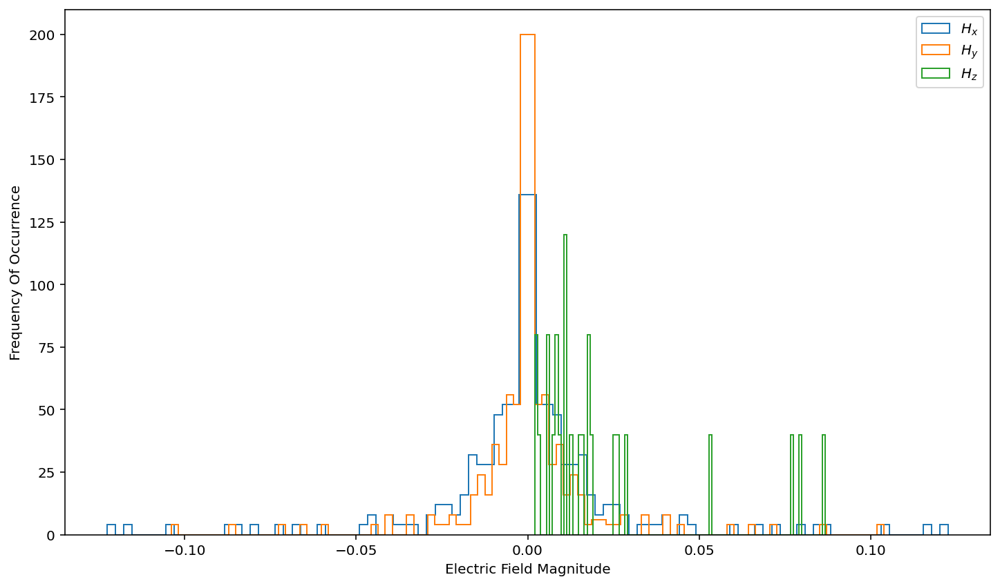

In [118]:
plt.hist(H_x.ravel(), bins=100, histtype='step',label=r'$H_x$')
plt.hist(H_y.ravel(), bins=100, histtype='step',label=r'$H_y$')
plt.hist(H_z.ravel(), bins=100, histtype='step',label=r'$H_z$')
plt.legend()
plt.xlabel('Electric Field Magnitude')
plt.ylabel('Frequency Of Occurrence')
plt.show()

In [91]:
H_max = 0.25
H_x[H_x>H_max] = H_max
H_y[H_y>H_max] = H_max
H_z[H_z>H_max] = H_max

H_x[H_x<-H_max] = -H_max
H_y[H_y<-H_max] = -H_max
H_z[H_z<-H_max] = -H_max

In [92]:
from IPython.display import HTML
# Definition des Vektorfeldes: Ortsvektor, E-Feld -> Komponenten müssen 1-d übergeben werden, daher wird .ravel() verwendet
data = go.Cone(x=x.ravel(), y=y.ravel(), z=z.ravel(),
               u=H_x.ravel(), v=H_y.ravel(), w=H_z.ravel(),
               colorscale='Inferno', colorbar=dict(title=r'$x^2$ norm'),
               sizemode="scaled", sizeref=0.5)
# Achsenbeschriftungen etc.
layout = go.Layout(title=f'Electric Field of Dipole with length {l}',
                     scene=dict(xaxis_title=r'x',
                                yaxis_title=r'y',
                                zaxis_title=r'z',
                                aspectratio=dict(x=1, y=1, z=1),
                                camera_eye=dict(x=1.2, y=1.2, z=1.2)))

fig = go.Figure(data = data, layout=layout)


# Anzeigegröße des HTML Outputs festlegen
HTML(fig.to_html(default_width=1000, default_height=600))

In [125]:
import sympy as sp
import numpy as np

def transform_to_xyz(expr, r, theta, phi):
    x = r * sp.sin(theta) * sp.cos(phi)
    y = r * sp.sin(theta) * sp.sin(phi)
    z = r * sp.cos(theta)
    return expr.subs([(r, sp.sqrt(x**2 + y**2 + z**2)), (theta, sp.atan2(sp.sqrt(x**2 + y**2), z)), (phi, sp.atan2(y, x))])

# Beispiel: Gleichung in Kugelkoordinaten
r, theta, phi = sp.symbols('r theta phi')
expr = sp.sin(theta) * sp.cos(phi)

# Gleichung in kartesischen Koordinaten transformieren
expr_xyz = transform_to_xyz(expr, r, theta, phi)

# Gleichung mit lambdify in numerische Funktion umwandeln
xyz_func = sp.lambdify((r, theta, phi), expr_xyz, modules='numpy')

# Werte für r, theta und phi definieren
r_val = 1.0
theta_val = np.pi / 4
phi_val = np.pi / 3

# Gleichung auswerten
result = xyz_func(r_val, theta_val, phi_val)

print(result)

0.3535533905932739


# versuch

In [157]:
import sympy as sp
import numpy as np
from IPython.display import HTML

def transform_to_xyz(expr, x, y, z):
    r, theta, phi = sp.symbols('r theta phi')
    expr = expr.subs([(r, sp.sqrt(x**2 + y**2 + z**2)), (theta, sp.acos(z / sp.sqrt(x**2 + y**2 + z**2))), (phi, sp.atan2(y, x))])
    expr = expr.subs([(sp.cos(theta), x / r), (sp.sin(theta), y / r), (sp.sin(phi), r * sp.sin(theta))])
    return expr

In [158]:
def unitvector_theta(H_theta, theta, phi):
    x = H_theta * sp.cos(theta) * sp.cos(phi)
    y = H_theta * sp.cos(theta) * sp.sin(phi) 
    z = H_theta * -1*sp.sin(theta)
    return x, y, z

In [213]:
def unitvector_phi(H_phi, theta, phi):
    x = H_phi * -1 * sp.sin(theta)*sp.sin(phi)
    y = H_phi *      sp.sin(theta)*sp.cos(phi)
    # z Komponente muss später noch auf 0 gesetzt werden -> r ist natürlich falsch
    z = r
    return x, y, z

In [211]:
x, y, z = sp.symbols('x y z')
r, theta, phi = sp.symbols('r theta phi')

In [215]:
I_0 = 1
kr=1
k = 1
l = 1
factor = (I_0 * sp.exp(-1j * kr))/((2 * sp.pi * r))
phasefactor = (sp.cos(((k*l)/2)*sp.cos(theta)) - sp.cos(k*l/2))/sp.sin(theta)
phasefactor = (phasefactor*r)/r
H_theta = 1j * factor *phasefactor


H_xyz = unitvector_phi(H_theta, theta, phi)
H_x,H_y,H_z = H_xyz

# Da der Koeffizient komplex ist werden nur die Beträge genommen
xx = sp.Abs(transform_to_xyz(H_x, x, y, z))
yy = sp.Abs(transform_to_xyz(H_y, x, y, z))
#zz = sp.Abs(transform_to_xyz(H_z, x, y, z))
zz = 0
xx_func = sp.lambdify((x, y, z), xx, modules='numpy')
yy_func = sp.lambdify((x, y, z), yy, modules='numpy')
#zz_func = sp.lambdify((x, y, z), zz, modules='numpy')


In [216]:
def H(x,y,z):
    return np.array([xx_func(x,y,z),
                    yy_func(x,y,z),
                    #zz_func(x,y,z)
                    0])

In [223]:
start = -0.001
stop = 0.05
samples = 10

x_range = np.linspace(start, stop, samples)
y_range = np.linspace(start, stop, samples)
z_range = np.linspace(start, stop, samples)
X, Y, Z = np.meshgrid(x_range, y_range, z_range)
H_field = np.vectorize(H, signature='(),(),()->(n)')(X, Y, Z)

In [224]:
H_x = H_field[:,:,:,0]
H_y = H_field[:,:,:,1]
H_z = H_field[:,:,:,2]

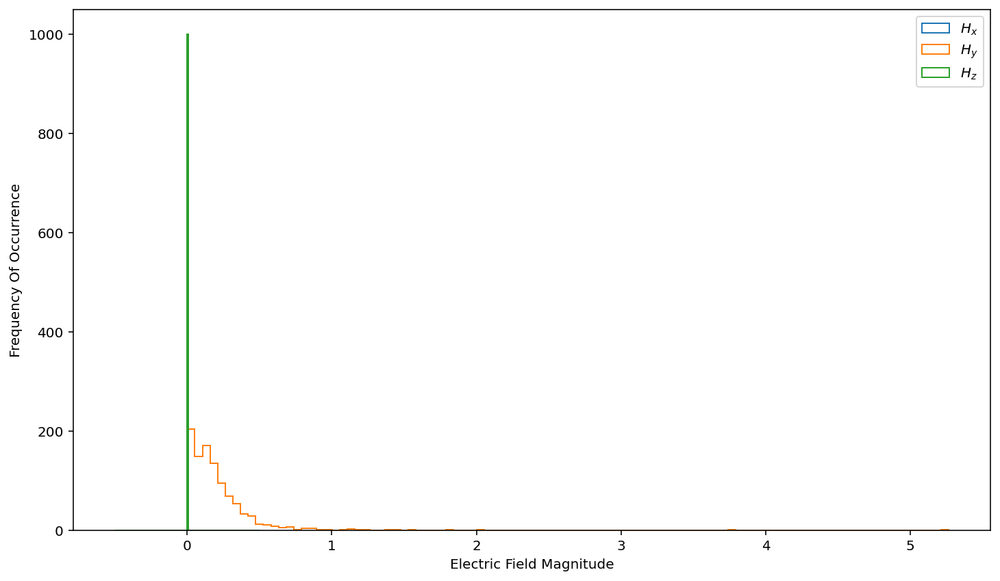

In [225]:
plt.hist(H_x.ravel(), bins=100, histtype='step',label=r'$H_x$')
plt.hist(H_y.ravel(), bins=100, histtype='step',label=r'$H_y$')
plt.hist(H_z.ravel(), bins=100, histtype='step',label=r'$H_z$')
plt.legend()
plt.xlabel('Electric Field Magnitude')
plt.ylabel('Frequency Of Occurrence')
plt.show()

In [226]:
H_max = 0.7
H_x[H_x>H_max] = H_max
H_y[H_y>H_max] = H_max
H_z[H_z>H_max] = H_max

H_x[H_x<-H_max] = -H_max
H_y[H_y<-H_max] = -H_max
H_z[H_z<-H_max] = -H_max

In [230]:
# Definition des Vektorfeldes: Ortsvektor, H-Feld -> Komponenten müssen 1-d übergeben werden, daher wird .ravel() verwendet
data = go.Cone(x=X.ravel(), y=Y.ravel(), z=Z.ravel(),
               u=H_x.ravel(), v=H_y.ravel(), w=H_z.ravel(),
               colorscale='Inferno', colorbar=dict(title=r'$x^2$ norm'),
               sizemode="scaled", sizeref=0.5)
# Achsenbeschriftungen etc.
layout = go.Layout(title=f'Magnetic Field of Dipole only with H_Phi Komponent in tangential Direction',
                     scene=dict(xaxis_title=r'x',
                                yaxis_title=r'y',
                                zaxis_title=r'z',
                                aspectratio=dict(x=1, y=1, z=1),
                                camera_eye=dict(x=1.2, y=1.2, z=1.2)))

fig = go.Figure(data = data, layout=layout)


# Anzeigegröße des HTML Outputs festlegen
HTML(fig.to_html(default_width=1000, default_height=600))